In [109]:
import os
from sklearn.model_selection import train_test_split
import pandas as pd
from tqdm import tqdm
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D,UpSampling2D
import tensorflow as tf
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.models import load_model
from keras import backend as K
from sklearn.manifold import TSNE

In [110]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='r'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """

    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

In [111]:
#Extracting image paths
train_files = os.listdir('train2/train')
test_files = os.listdir('test/test')

print("Number of Training Images:",len(train_files))
print("Number of Test Images: ",len(test_files))
train_files = pd.DataFrame(train_files,columns=['filepath'])
test_files = pd.DataFrame(test_files,columns=['filepath'])

Number of Training Images: 568
Number of Test Images:  63


In [118]:
def image2array(file_array,floder):
 """
 Reading and Converting images into numpy array by taking path of images.
 Arguments:
 file_array - (list) - list of file(path) names
 Returns:
 A numpy array of images. (np.ndarray)
 """
 image_array = []
 for path in tqdm(file_array['filepath']):
    if path != '.ipynb_checkpoints':
      img = cv2.imread(floder+'/'+path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      img = cv2.resize(img, (224,224))
      image_array.append(np.array(img))
 image_array = np.array(image_array)
 image_array = image_array.reshape(image_array.shape[0], 224, 224, 3)
 image_array = image_array.astype('float32')
 image_array /= 255
 return np.array(image_array)


In [113]:
def feature_extraction(model, data, layer = 4):

    """
    Creating a function to run the initial layers of the encoder model. (to get feature extraction from any layer of the model)
    Arguments:
    model - (Auto encoder model) - Trained model
    data - (np.ndarray) - list of images to get feature extraction from trained model
    layer - (int) - from which layer to take the features(by default = 4)
    Returns:
    pooled_array - (np.ndarray) - array of extracted features of given images
    """

    encoded = K.function([model.layers[0].input],[model.layers[layer].output])
    encoded_array = encoded([data])[0]
    pooled_array = encoded_array.max(axis=-1)
    return encoded_array

In [114]:
def get_batches(data, batch_size=1000):

    """
    Taking batch of images for extraction of images.
    Arguments:
    data - (np.ndarray or list) - list of image array to get extracted features.
    batch_size - (int) - Number of images per each batch
    Returns:
    list - extracted features of each images
    """

    if len(data) < batch_size:
        return [data]
    n_batches = len(data) // batch_size
    
    # If batches fit exactly into the size of df.
    if len(data) % batch_size == 0:
        return [data[i*batch_size:(i+1)*batch_size] for i in range(n_batches)]   

    # If there is a remainder.
    else:
        return [data[i*batch_size:min((i+1)*batch_size, len(data))] for i in range(n_batches+1)]

In [119]:
train_data = image2array(train_files,"train2/train")
print("Length of training dataset:",train_data.shape)
test_data = image2array(test_files,"test/test")
print("Length of test dataset:",test_data.shape) 

100%|██████████| 568/568 [00:07<00:00, 80.58it/s] 


Length of training dataset: (567, 224, 224, 3)


100%|██████████| 63/63 [00:00<00:00, 68.90it/s]


Length of test dataset: (63, 224, 224, 3)


In [120]:
def encoder_decoder_model():

  """
  Used to build Convolutional Autoencoder model architecture to get compressed image data which is easier to process.
  Returns:
  Auto encoder model
  """
  #Encoder
  model = Sequential(name='Convolutional_AutoEncoder_Model')
  model.add(Conv2D(64, kernel_size=(3, 3),activation='relu',input_shape=(224, 224, 3),padding='same', name='Encoding_Conv2D_1'))
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_1'))
  model.add(Conv2D(128, kernel_size=(3, 3),strides=1,kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu',padding='same', name='Encoding_Conv2D_2'))
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_2'))
  model.add(Conv2D(256, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_3'))
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_3'))
  model.add(Conv2D(512, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_4'))
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2,padding='valid', name='Encoding_MaxPooling2D_4'))
  model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_5'))
  model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))

  #Decoder
  model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu', padding='same', name='Decoding_Conv2D_1'))
  model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_1'))
  model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same', name='Decoding_Conv2D_2'))
  model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_2'))
  model.add(Conv2D(256, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same',name='Decoding_Conv2D_3'))
  model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_3'))
  model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_4'))
  model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_4'))
  model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_5'))
  model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_5'))
  model.add(Conv2D(3, kernel_size=(3, 3), padding='same',activation='sigmoid',name='Decoding_Output'))
  return model

In [10]:
import os
import numpy as np
import tensorflow as tf
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
CUDA_VISIBLE_DEVICES=1
# Check which GPU TensorFlow is using
print("TensorFlow GPU device:", tf.test.gpu_device_name())

TensorFlow GPU device: /device:GPU:0
Num GPUs Available:  1


2024-02-28 22:20:59.113631: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /device:GPU:0 with 31081 MB memory:  -> device: 0, name: Quadro RTX 8000, pci bus id: 0000:3b:00.0, compute capability: 7.5


In [65]:
# Function to perform TensorFlow operations
def perform_operations_on_gpu1():
    with tf.device('/GPU:1'):
        # Your TensorFlow operations here
        # For example:
        a = tf.constant([1.0, 2.0, 3.0])
        b = tf.constant([4.0, 5.0, 6.0])
        c = a + b
        return c

# Call the function to perform operations on GPU 1
result = perform_operations_on_gpu1()

# Check which GPU TensorFlow is using
print("TensorFlow GPU device:", tf.test.gpu_device_name())

# Print the result
print("Result:", result.numpy())

TensorFlow GPU device: /device:GPU:0
Result: [5. 7. 9.]


2024-02-28 20:51:12.645066: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /device:GPU:0 with 44269 MB memory:  -> device: 0, name: Quadro RTX 8000, pci bus id: 0000:18:00.0, compute capability: 7.5
2024-02-28 20:51:12.645360: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /device:GPU:1 with 31071 MB memory:  -> device: 1, name: Quadro RTX 8000, pci bus id: 0000:3b:00.0, compute capability: 7.5


In [135]:
model = encoder_decoder_model
optimizer = Adam(learning_rate=1e-4)
model = encoder_decoder_model()
model.compile(optimizer=optimizer, loss='mse')
early_stopping = EarlyStopping(monitor='val_loss', mode='min',verbose=1,patience=30,min_delta=0.0001)
checkpoint = ModelCheckpoint('encoder_model', monitor='val_loss', mode='min', save_best_only=True)
history = model.fit(train_data, train_data, epochs=1000, batch_size=4,validation_data=(test_data,test_data),callbacks=[early_stopping])

Epoch 1/1000
142/142 [==============================] - 5s 27ms/step - loss: 1.3206 - val_loss: 0.6906
Epoch 2/1000
142/142 [==============================] - 4s 27ms/step - loss: 0.4468 - val_loss: 0.2822
Epoch 3/1000
142/142 [==============================] - 4s 26ms/step - loss: 0.2179 - val_loss: 0.1661
Epoch 4/1000
142/142 [==============================] - 4s 25ms/step - loss: 0.1429 - val_loss: 0.1198
Epoch 5/1000
142/142 [==============================] - 4s 25ms/step - loss: 0.1098 - val_loss: 0.0964
Epoch 6/1000
142/142 [==============================] - 4s 25ms/step - loss: 0.0904 - val_loss: 0.0809
Epoch 7/1000
142/142 [==============================] - 4s 26ms/step - loss: 0.0779 - val_loss: 0.0737
Epoch 8/1000
142/142 [==============================] - 4s 26ms/step - loss: 0.0689 - val_loss: 0.0629
Epoch 9/1000
142/142 [==============================] - 4s 26ms/step - loss: 0.0623 - val_loss: 0.0583
Epoch 10/1000
142/142 [==============================] - 4s 28ms/step - l

In [137]:
model.save('encoder_model')

Cause: Unable to locate the source code of <function trace_model_call.<locals>._wrapped_model at 0x7f9504521d30>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function trace_model_call.<locals>._wrapped_model at 0x7f9504521d30>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function trace_model_call.<locals>._wrapped_model at 0x7f9504521d30>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('signature_function', 'signature_key'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('signature_function', 'signature_key'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('signature_function', 'signature_key'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


INFO:tensorflow:Assets written to: encoder_model/assets


INFO:tensorflow:Assets written to: encoder_model/assets


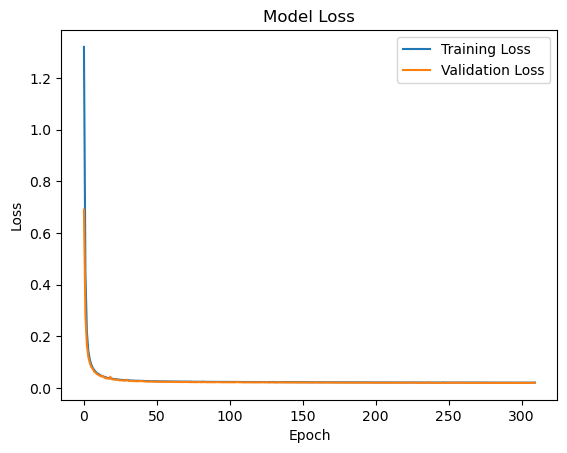

In [138]:
# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [139]:
from keras.losses import MeanSquaredError
optimizer = Adam(learning_rate=0.001)
model = load_model("encoder_model")
model.compile(optimizer=optimizer, loss="mse")

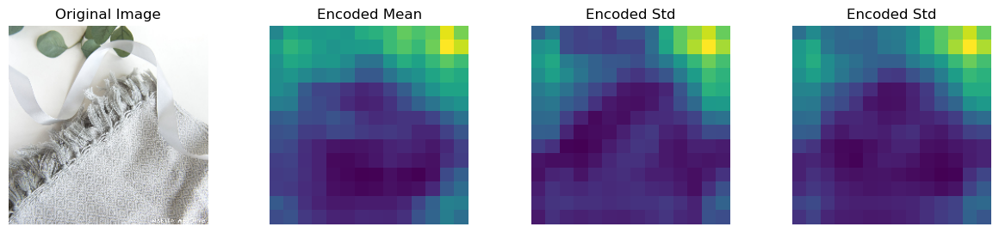

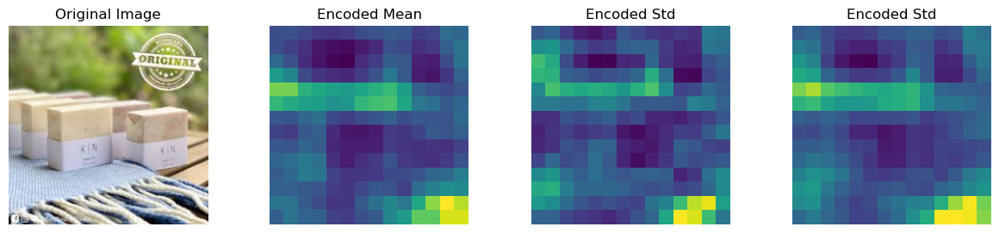

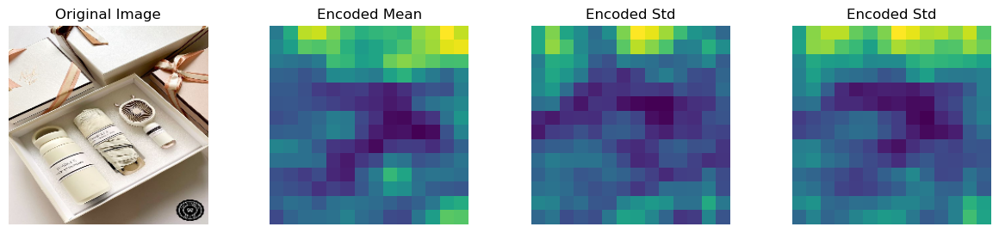

In [147]:
encoded = feature_extraction(model,train_data[:10],12)
for index in [2,3,4]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Std","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

1/1 [==============================] - 0s 42ms/step


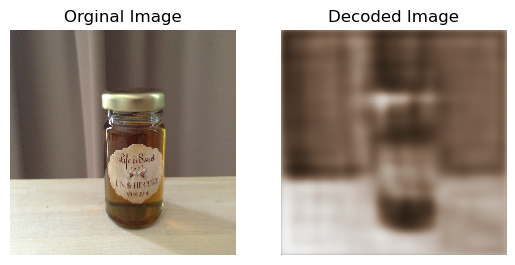

In [146]:
sample_image = train_data[55]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()


In [148]:
d = np.concatenate([train_data,test_data],axis=0)
d.shape

(630, 224, 224, 3)

In [149]:
X_encoded = []
i=0
# Iterate through the full training set.
for batch in get_batches(d, batch_size=300):
    i+=1
    # This line runs our pooling function on the model for each batch.
    X_encoded.append(feature_extraction(model, batch,12))
    
X_encoded = np.concatenate(X_encoded)

In [150]:
X_encoded.shape 

(630, 14, 14, 512)

In [152]:
X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2]*X_encoded.shape[3])
print('Encoded shape:', X_encoded_reshape.shape)
np.save('X_encoded_compressed2.npy',X_encoded_reshape)

Encoded shape: (630, 100352)


In [153]:
X_encoded_reshape = np.load('X_encoded_compressed2.npy')
X_encoded_reshape.shape

(630, 100352)

In [154]:
transform = TSNE 
trans = transform(n_components=2) 
values = trans.fit_transform(X_encoded_reshape) 

/opt/tljh/user/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/tljh/user/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [155]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot 
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

In [157]:
lisp=pd.concat([train_files, test_files], axis=0)
print(len(lisp))

631


In [162]:
lisp=os.listdir('all_data')
lisp = np.array(lisp)

if Number of clusters: 3


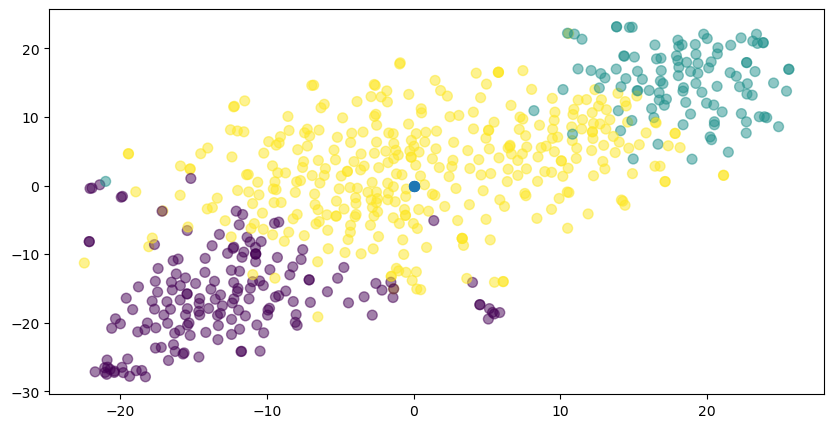

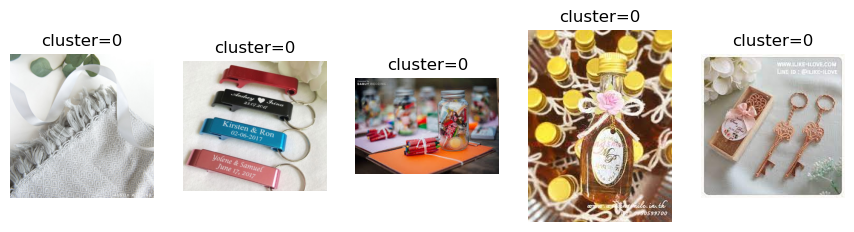

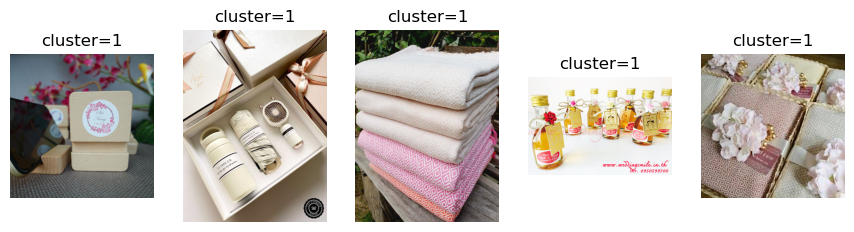

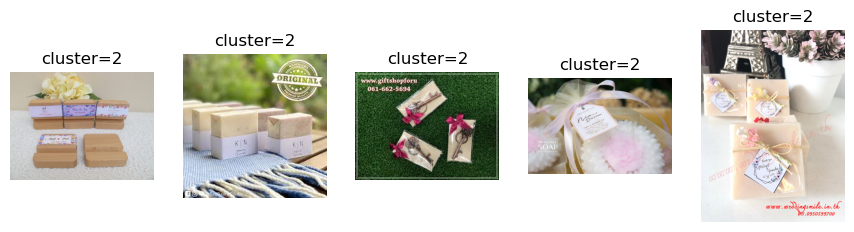


if Number of clusters: 4


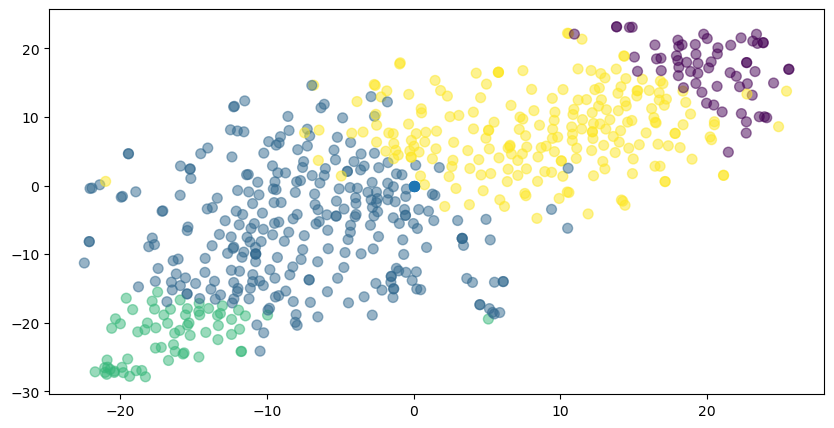

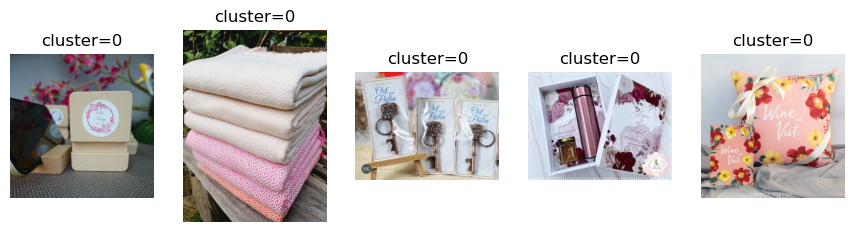

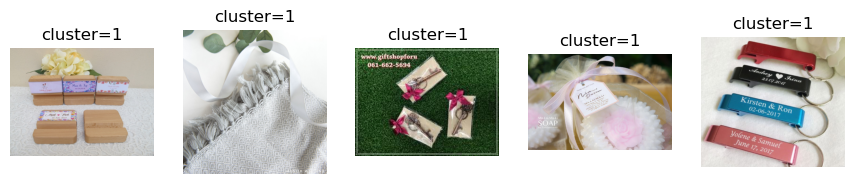

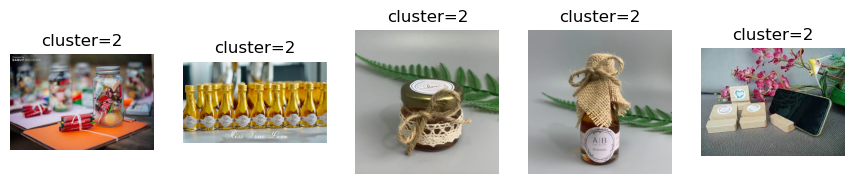

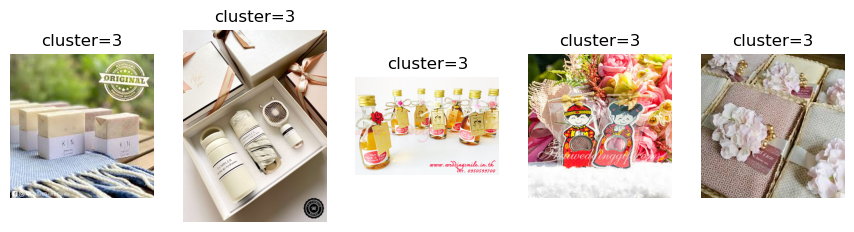


if Number of clusters: 5


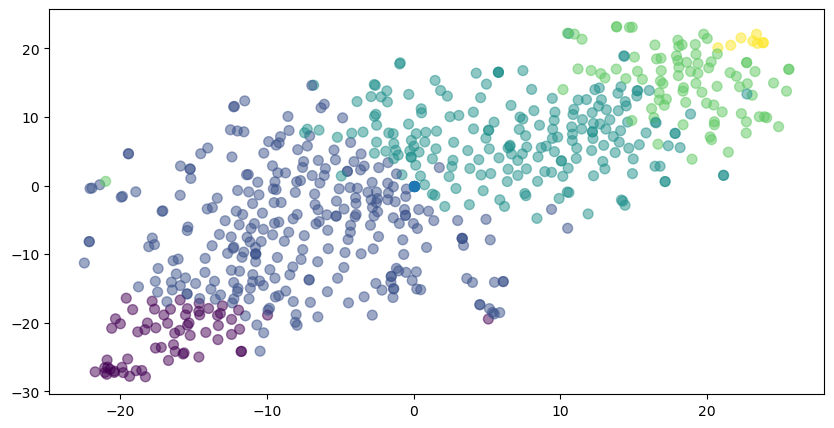

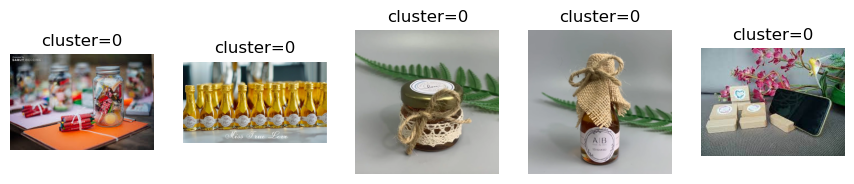

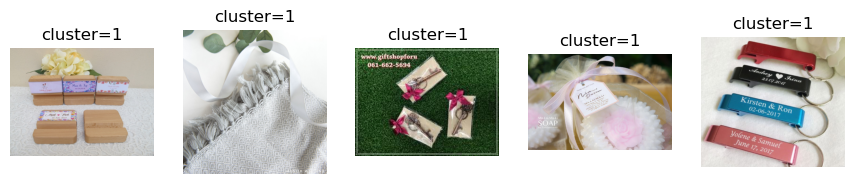

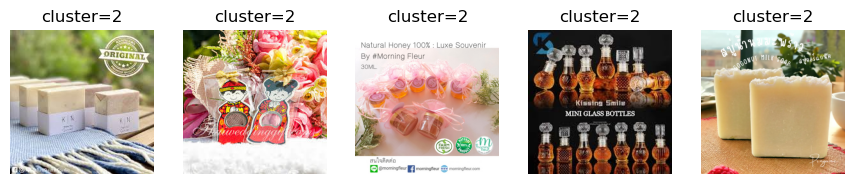

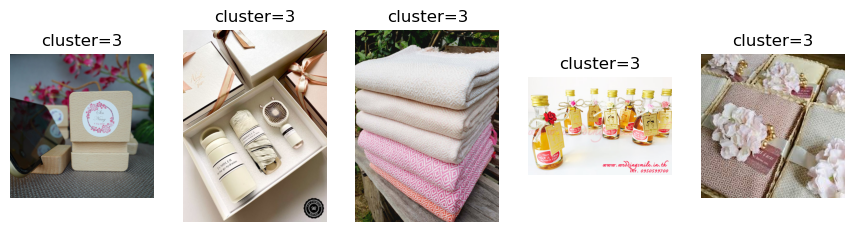

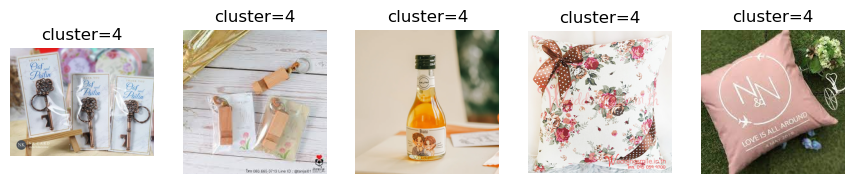


if Number of clusters: 6


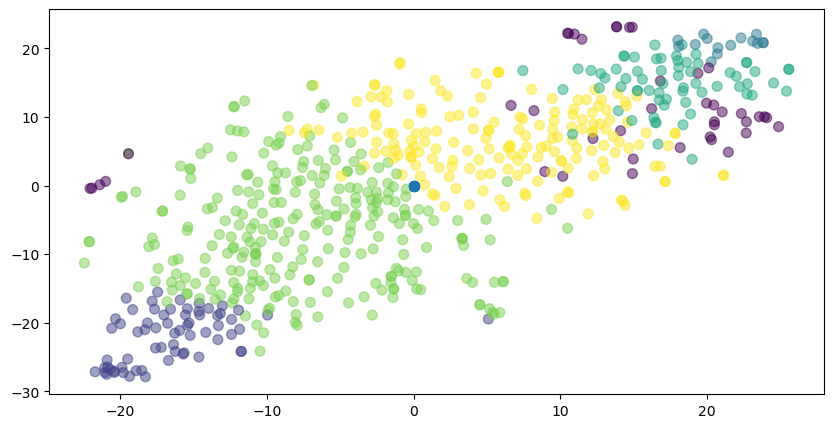

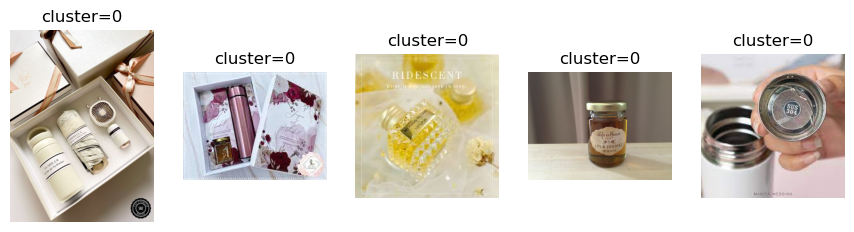

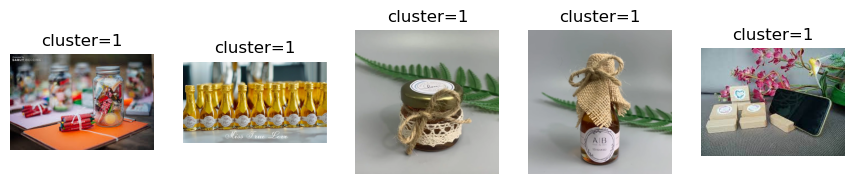

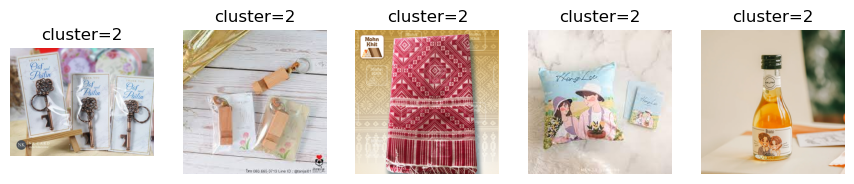

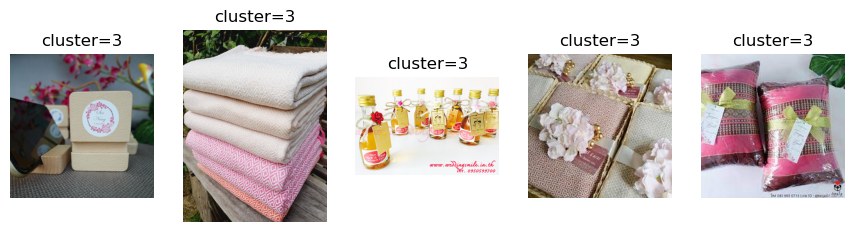

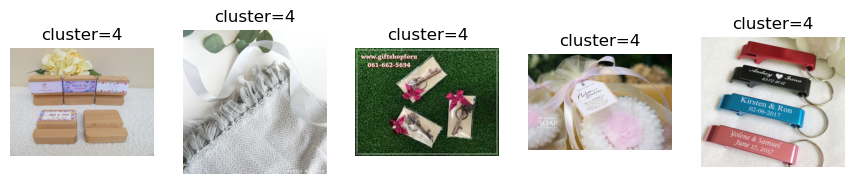

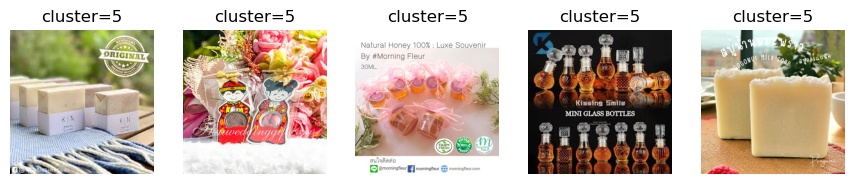


if Number of clusters: 7


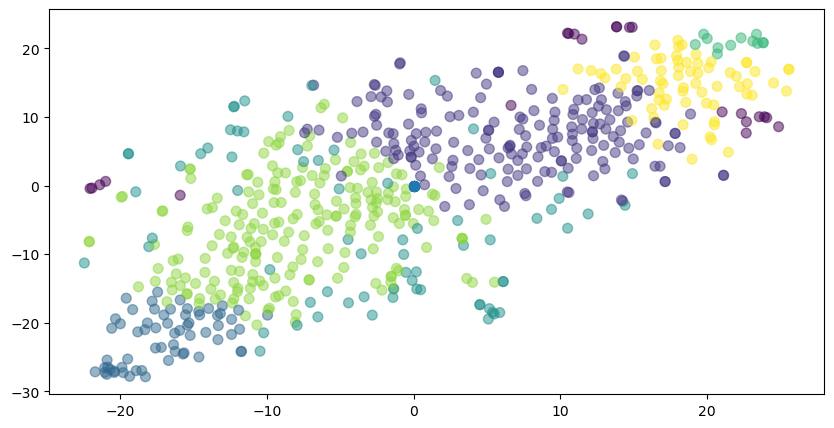

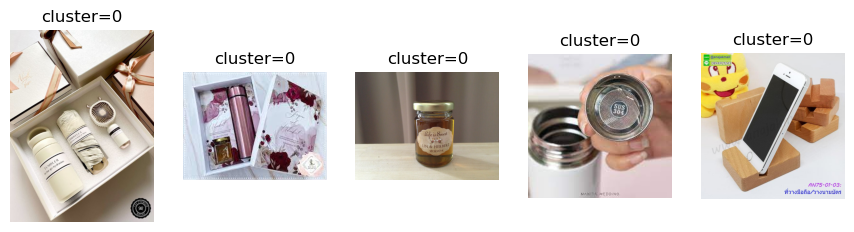

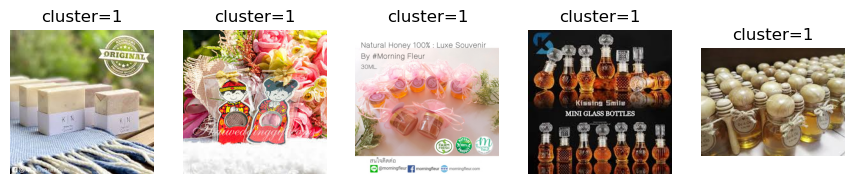

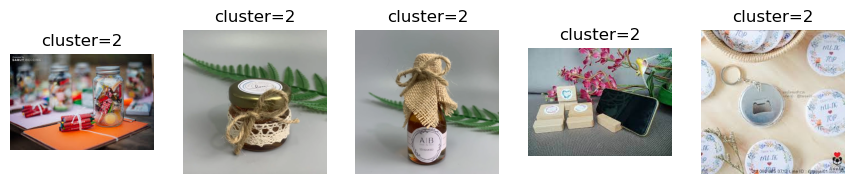

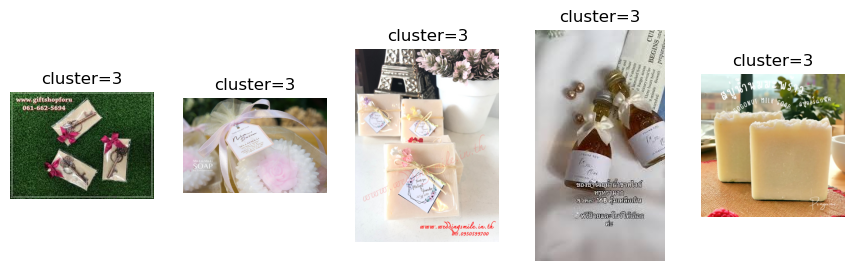

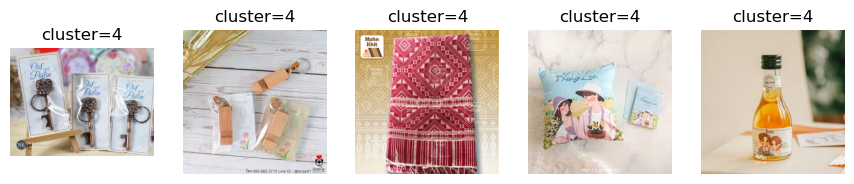

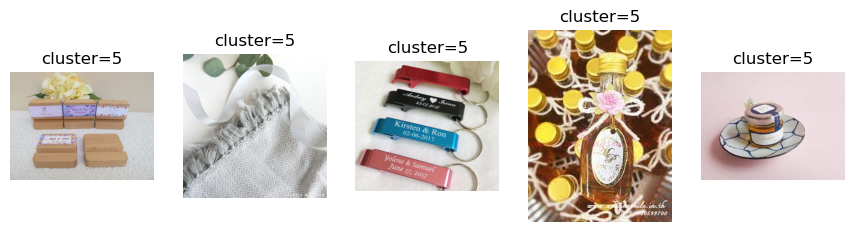

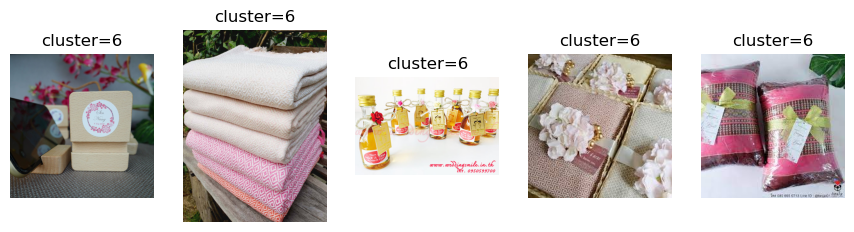

In [205]:
from sklearn.cluster import KMeans
K = [3,4,5,6,7]
for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(X_encoded_reshape)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    plt.figure(figsize=(10,5)) 
    plt.subplot(1,1,1)
    plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
    plt.show()
    for row in range(k): 
        iter=0
        plt.figure(figsize=(13,3))
        for i,iterator in enumerate(labels):
            if iterator == row:
                img = cv2.imread("all_data/"+lisp[i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                plot_(img,"","",1,6,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=5: break
        plt.show()
    print() 

In [172]:
#Training the model with optimial K value (6 in our case)
kmeans = KMeans(n_clusters = 6, random_state=0).fit(X_encoded_reshape)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

In [174]:
import joblib
kmeans_file = 'kmeans_model.pkl'
joblib.dump(kmeans,kmeans_file)

['kmeans_model.pkl']

In [175]:
clusters_features = []
cluster_files=[]
for i in [0,1,2,3,4,5,6]:
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(X_encoded_reshape[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [176]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(630,)
(630, 100352)
(630,)


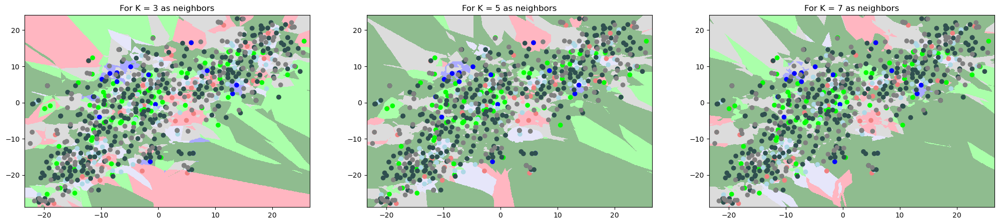

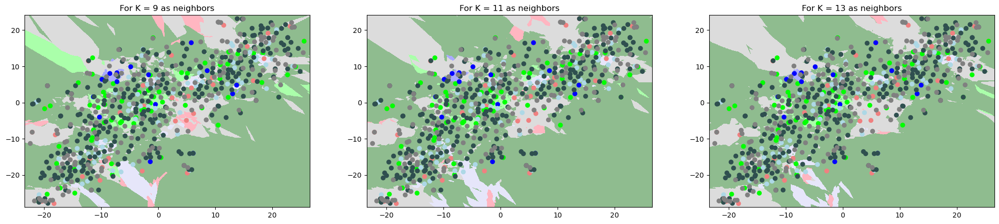

In [184]:
from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier 
for i in [[3,5,7],[9,11,13]]:
    plt.figure(figsize=(25,5))
    for iter,j in enumerate(i):
        n_neighbors = j
        X = values  
        y = labels
        h = .09  # step size in the mesh
        cmap_light = ListedColormap(['#FFB6C1', '#AAFFAA', '#AAAAFF','#E6E6FA','#8FBC8F','#DCDCDC'])
        cmap_bold = ListedColormap(['#F08080', '#00FF00', '#0000FF','#ADD8E6','#2F4F4F','#808080'])
        clf = KNeighborsClassifier(n_neighbors)
        clf.fit(X, y)

        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1 
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1 
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        plt.subplot(1,3,iter+1)
        Z = Z.reshape(xx.shape)
        plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

        # Plot also the training points 
        plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold)
        plt.xlim(xx.min(), xx.max())
        plt.ylim(yy.min(), yy.max())
        plt.title("For K = {} as neighbors".format(j))
    plt.show()  

In [185]:
knn = KNeighborsClassifier(n_neighbors=3,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=3)

In [186]:
knn_file = 'knn_model3.pkl'
joblib.dump(knn,knn_file)

['knn_model3.pkl']

In [190]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """

    def read(img):
        image = cv2.imread('all_data/'+img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,5))
    for iter,i in enumerate(result):
        plot_(read(files[i]),"","",1,len(result),iter+1,files[i],"","","",True)
    plt.show()

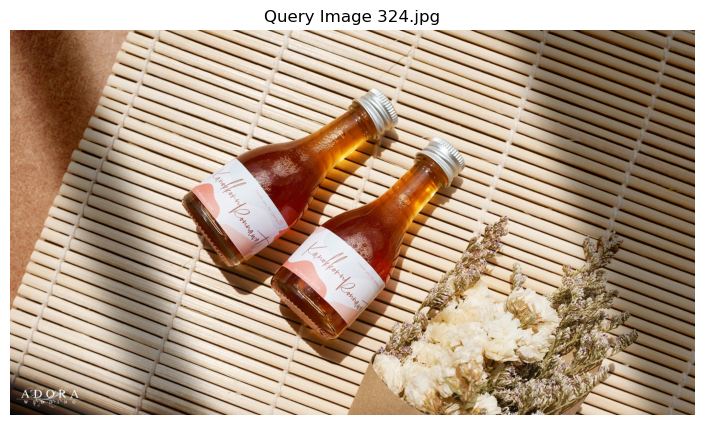

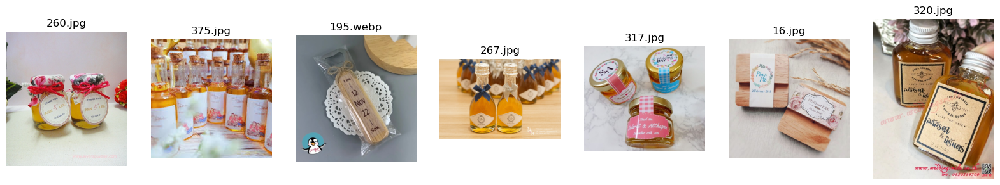

In [208]:
num = 14 #datapoint
res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=8)
results_(num,list(res[1][0])[1:])